In [1]:
# !pip install colorcet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 77.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.3/87.3 KB 20.6 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [2]:
import pandas as pd
import numpy as np
import os
import re


# visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tabulate import tabulate

# styling
%matplotlib inline
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.facecolor'] = '#00000000'
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [3]:
df = pd.read_csv('/work/Airbnb_Open_Data.csv')

/shared-libs/python3.9/py-core/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3139: DtypeWarning: Columns (25) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


### Getting to Know the Data.

In [4]:
df.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [5]:
df.shape

(102599, 26)

In [6]:
df.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

In [7]:
df.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


In [8]:
df.dtypes

id                                  int64
NAME                               object
host id                             int64
host_identity_verified             object
host name                          object
neighbourhood group                object
neighbourhood                      object
lat                               float64
long                              float64
country                            object
country code                       object
instant_bookable                   object
cancellation_policy                object
room type                          object
Construction year                 float64
price                              object
service fee                        object
minimum nights                    float64
number of reviews                 float64
last review                        object
reviews per month                 float64
review rate number                float64
calculated host listings count    float64
availability 365                  

As we can see there are some data-type issues with columns such as price, last review that might lead to inaccurate results. We need to fix these issues in the data cleaning process.

In [9]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'percent_missing': round(percent_missing, 2)}).reset_index().rename(columns={'index':'column'})
missing_value_df

,column,percent_missing
0,id,0.00
1,NAME,0.24
2,host id,0.00
3,host_identity_verified,0.28
4,host name,0.40
5,neighbourhood group,0.03
6,neighbourhood,0.02
7,lat,0.01
8,long,0.01
9,country,0.52


The columns need to be removed that have a high missing data percentage. This would enhance data processing efficiency and make it easier to work with the data.

In [10]:
df.nunique()

id                                102058
NAME                               61281
host id                           102057
host_identity_verified                 2
host name                          13190
neighbourhood group                    7
neighbourhood                        224
lat                                21991
long                               17774
country                                1
country code                           1
instant_bookable                       2
cancellation_policy                    3
room type                              4
Construction year                     20
price                               1151
service fee                          231
minimum nights                       153
number of reviews                    476
last review                         2477
reviews per month                   1016
review rate number                     5
calculated host listings count        78
availability 365                     438
house_rules     

### The table below displays the number of unique entries for each column.

In [11]:
from IPython.core.display import HTML


def multi_table(table_list):
    table_html = '<table style="border-collapse: collapse; border: 1px solid black; width: 100%;">'
    
    # Add data rows
    for i, table in enumerate(table_list):
        table_html += '<tr>'
        table_html += '<td style="border: 1px solid black; padding: 8px; vertical-align: top;">'
        table_html += '<div style="max-height: 400px; overflow-y: auto;">'  # Add scrollbar for tall tables
        table_html += table._repr_html_()
        table_html += '</div>'
        table_html += '</td>'
        table_html += '</tr>'
    
    table_html += '</table>'
    
    return HTML(table_html)


variables = ['host_identity_verified', 'neighbourhood group', 'instant_bookable',
             'cancellation_policy', 'room type', 'review rate number', 'Construction year']

nunique_df = {}

for var in variables:
    count_df = pd.DataFrame(df[var].value_counts())
    nunique_df[var] = count_df

multi_table([nunique_df['host_identity_verified'],nunique_df['neighbourhood group'],nunique_df['instant_bookable'],nunique_df['cancellation_policy'],nunique_df['room type'],nunique_df['review rate number'],nunique_df['Construction year']])

,host_identity_verified
unconfirmed,51200
verified,51110
,neighbourhood group
Manhattan,43792
Brooklyn,41842
Queens,13267
Bronx,2712
Staten Island,955
brookln,1
manhatan,1


### Preparing the Dataset for Analysis

In [12]:
df.columns=[col.lower().replace(" ","_") for col in df.columns]
df.columns

Index(['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long', 'country',
       'country_code', 'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'license'],
      dtype='object')

In [13]:
print(df["id"].unique().shape[0]/df["id"].shape[0]*100)
print(df["host_id"].unique().shape[0]/df["host_id"].shape[0]*100)

99.47270441232371
99.47172974395461


In [14]:
print(df["country_code"].value_counts())
print()
print(df["country"].value_counts())

US    102468
Name: country_code, dtype: int64

United States    102067
Name: country, dtype: int64


Eliminating Redundancy: Removing Country Code and Country Columns, as Listings Data is Exclusive to NYC. License column has a higher percentage of missing values.

In [15]:
df.drop(columns=["country_code", "country", "license"],axis=1,inplace=True)

There exist 541 duplicate rows so we have to drop them too.

In [16]:
print(df[df.duplicated()].shape)
df.drop_duplicates(keep='first', inplace=True)

(541, 23)


In [17]:
def remove_dollar_sign_and_to_float(value):
    if pd.isna(value):
        return np.NaN
    else:
        return pd.to_numeric(re.sub(r'[\$, ]', '', value), errors='coerce')

Converting Price and Service_Fee Columns from String to Numeric, and Removing Dollar Signs for Consistent Analysis.

In [18]:
df["price"]=df["price"].apply(lambda x: remove_dollar_sign_and_to_float(x))
df["service_fee"]=df["service_fee"].apply(lambda x: remove_dollar_sign_and_to_float(x)) 

In [19]:
df['price'].min()

50.0

As observed, there are instances of negative price values, which are not possible in the context of our dataset. We assume that the negative sign might be a data entry mistake. In order to rectify this issue and preserve the magnitude of price values for analysis, we apply the absolute function to the 'price' column. This step ensures that all price values are treated as positive, allowing us to retain the numerical information while disregarding the erroneous negative signs.

In [20]:
df['price'] = df['price'].abs()

In [21]:
df["last_review"]=pd.to_datetime(df["last_review"])

In [22]:
df['neighbourhood_group'].value_counts()

Manhattan        43557
Brooklyn         41630
Queens           13197
Bronx             2694
Staten Island      949
brookln              1
manhatan             1
Name: neighbourhood_group, dtype: int64

Replacing anomalies in neighbourhood_group column such as manhatan, brookln

In [23]:
df['neighbourhood_group'] = df['neighbourhood_group'].replace(['manhatan'], 'Manhattan')
df['neighbourhood_group'] = df['neighbourhood_group'].replace(['brookln'], 'Brooklyn')

In [24]:
print(df['last_review'].min(), df['last_review'].max())

2012-07-11 00:00:00 2058-06-16 00:00:00


As observed some dates in the dataset are exceeding the year 2023, indicating anomalies or data entry errors. Instead of removing the dates entirely, we will address this issue by replacing any dates beyond 2023 with the dataset's median date. This approach helps maintain data integrity while accounting for potential errors, ensuring a reliable and consistent dataset for analysis.

In [25]:
 df.loc[df[df['last_review'].apply(lambda x: x.year) > 2023].index, 'last_review'] = df['last_review'].median()

In [26]:
df.sample(5)

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
80687,45564766,The Absolute Best Location in NYC – Priv. Bedroom,40150095319,unconfirmed,Ben,Queens,Long Island City,40.74286,-73.95417,False,...,1184.0,237.0,2.0,111.0,2019-07-02,4.46,3.0,1.0,109.0,NaN
100791,56668205,One Bedroom off of Franklin Avenue in Brooklyn,52548652885,verified,Tj,Brooklyn,Crown Heights,40.67060,-73.96026,True,...,204.0,41.0,6.0,0.0,NaT,NaN,5.0,1.0,0.0,There are no towels included
9862,6448119,Cute & Cozy Short or Long Term Stay!,51732058444,unconfirmed,Chris,Queens,Jamaica,40.68692,-73.78022,True,...,1092.0,218.0,1.0,63.0,2018-11-01,1.34,2.0,2.0,92.0,NaN
46524,26696541,Trendy & Modern Bushwick Brooklyn Apartment,32058920346,verified,Daniel,Brooklyn,Bedford-Stuyvesant,40.69460,-73.93448,True,...,648.0,130.0,4.0,2.0,2019-06-28,2.00,4.0,1.0,28.0,Please remember that this is a residential bui...
44751,25717313,Sumptin' Simple on Sumpter,79410424060,verified,Sofia,Brooklyn,Bedford-Stuyvesant,40.68079,-73.91893,True,...,343.0,69.0,1.0,14.0,2019-06-30,6.36,2.0,2.0,249.0,There is no smoking allowed anywhere on the pr...


In [27]:
df.shape

(102058, 23)

In [28]:
df.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_identity_verified                    object
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
lat                                      float64
long                                     float64
instant_bookable                          object
cancellation_policy                       object
room_type                                 object
construction_year                        float64
price                                    float64
service_fee                              float64
minimum_nights                           float64
number_of_reviews                        float64
last_review                       datetime64[ns]
reviews_per_month                        float64
review_rate_number                       float64
calculated_host_list

# Analyzing the Cleaned Data: Discovering Patterns and Insights

### Exploring top 10 listing names, host names, 

In [29]:
def plot_bar_chart(df, column_name, title_param, top_values=None, palette="flare", 
                   show_grid=True, figsize=(12, 6), bar_font_size=12,
                   bar_angle=45, x_label_angle=45, title_font_size=18, 
                   x_label_font_size=14, y_label_font_size=14, show_percentage=False):
    
    # Create a copy of the DataFrame to avoid modifying the original DataFrame
    df_copy = df.copy()
    
    # Ensure the column_name is a valid column in the DataFrame
    if column_name not in df_copy.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")
    
    # Set up the plot
    fig, ax = plt.subplots(figsize=figsize)
    sns.set_palette(palette)
    
    # Get the top values if specified
    if top_values is not None:
        counts = df_copy[column_name].value_counts().iloc[:top_values]
    else:
        counts = df_copy[column_name].value_counts()
    
    # Plot the bar chart
    bar_ax = sns.barplot(x=counts.index, y=counts, palette=palette, ax=ax)
    
    # Add bar labels with rotation
    for i in bar_ax.containers:
        bar_ax.bar_label(i, rotation=bar_angle, fontsize=bar_font_size)
    
    # Set x-axis and y-axis labels, title, and grid
    plt.xticks(rotation=x_label_angle, fontsize=x_label_font_size)
    plt.xlabel(column_name, fontweight="bold", fontsize=x_label_font_size)
    plt.ylabel("Count", fontweight="bold", fontsize=y_label_font_size)
    plt.title(f"Top {top_values} {title_param}" if top_values is not None else column_name, fontsize=title_font_size)
    if show_grid:
        plt.grid(True, linestyle="--", alpha=0.7)
    
    # Optionally show percentage on top of bars
    if show_percentage:
        total_count = df_copy[column_name].count()
        for patch in bar_ax.patches:
            height = patch.get_height()
            bar_ax.annotate(f"{(height / total_count) * 100:.2f}%", 
                            xy=(patch.get_x() + patch.get_width() / 2, height), 
                            xytext=(0, 3), textcoords="offset points", 
                            ha='center', fontsize=bar_font_size, fontweight="bold")
    
    plt.tight_layout()
    plt.show()


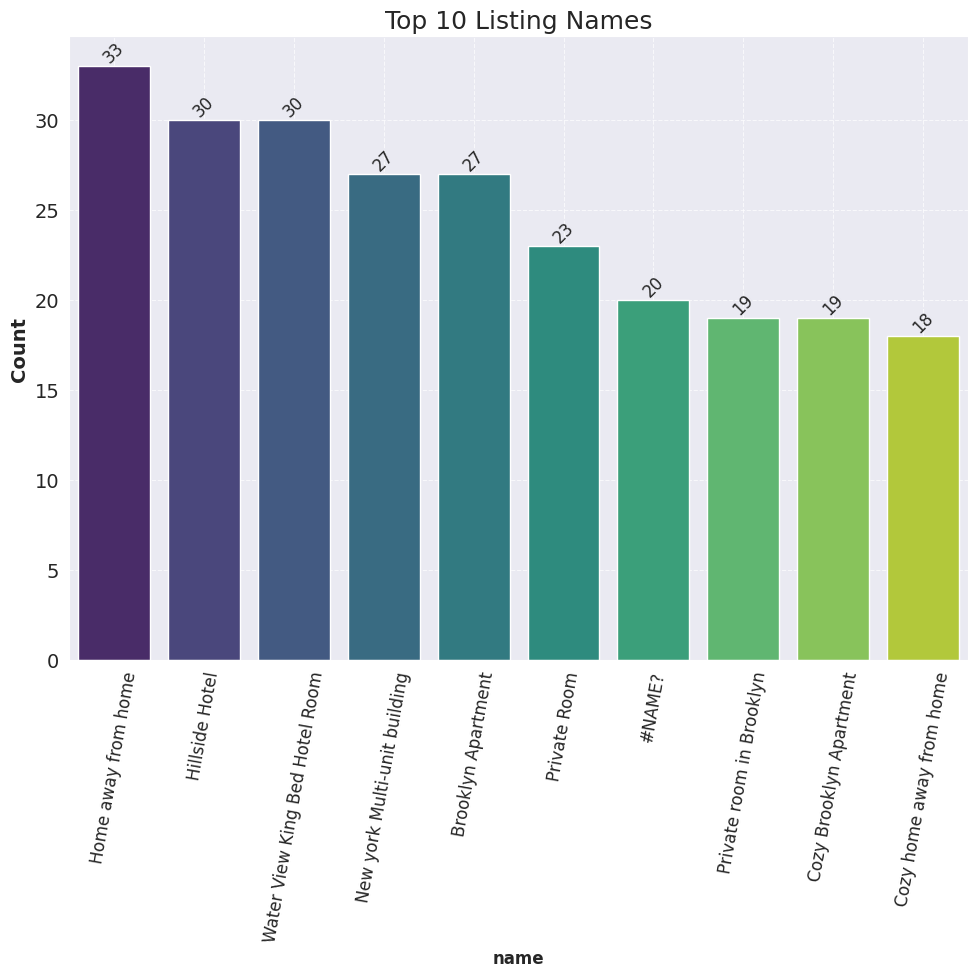

In [30]:
# plot_bar_chart(column_name = "name", top_values = 20, palette = "coolwarm", show_grid = True, angle = 85)
plot_bar_chart(df, column_name="name", top_values=10, title_param='Listing Names',
               palette="viridis", show_grid=True, figsize=(10, 10), 
               bar_font_size=12, bar_angle=45, x_label_angle=80, 
               title_font_size=18, x_label_font_size=12, y_label_font_size=14,
               show_percentage=False)

The graph above displays the count of listing names, revealing interesting patterns in the frequently occurring names. These names offer significant benefits for both hosts and customers.

For instance, the name "Home Away from Home" evokes a sense of comfort and warmth, making guests feel at ease during their stay. For hosts, it conveys a welcoming atmosphere, potentially attracting more bookings from travelers seeking a homey experience. Similarly, the name "Hillside Hotel" suggests a picturesque location, appealing to travelers seeking a tranquil and scenic retreat. Hosts can leverage this name to highlight the natural beauty and serenity of their property, attracting nature enthusiasts and vacationers alike.

The carefully chosen listing names can significantly impact the guest experience, generating positive impressions and increasing the likelihood of bookings. By catering to specific preferences and expectations, hosts can differentiate their listings in a competitive market, leading to enhanced customer satisfaction and improved business opportunities.

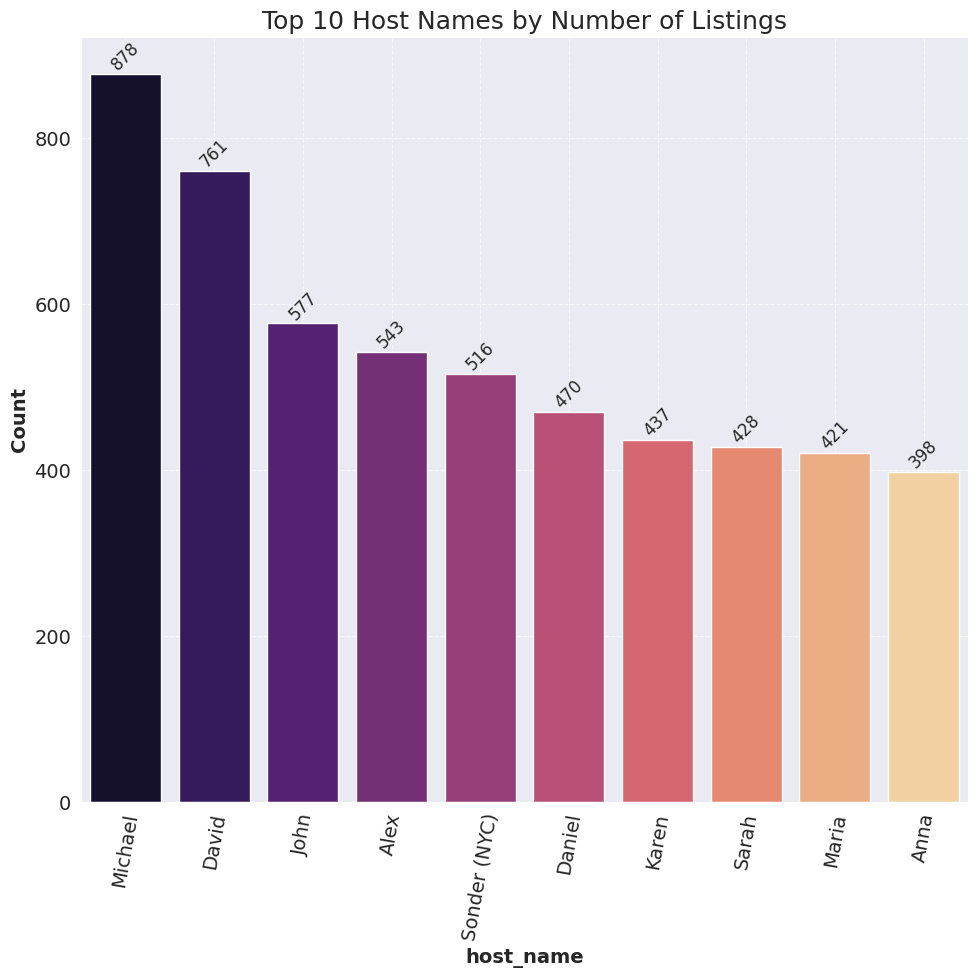

In [31]:
plot_bar_chart(df, column_name="host_name", top_values=10, title_param='Host Names by Number of Listings',
               palette="magma", show_grid=True, figsize=(10, 10), 
               bar_font_size=12, bar_angle=45, x_label_angle=80, 
               title_font_size=18, x_label_font_size=14, y_label_font_size=14,
               show_percentage=False)

### Discovering the Airbnb NYC Hotspots: Which NYC Boroughs and Neighborhoods contains the Highest Number of Listings?

In [32]:
df['tmp']=1

fig = px.pie(df, names="neighbourhood_group", values='tmp', hole=0.6,
             title="Distribution of Properties by Neighbourhood Group",
             color_discrete_map={
                 "Manhattan": "#1f77b4",  # Dark blue
                 "Brooklyn": "#ff7f0e",   # Orange
                 "Queens": "#2ca02c",    # Green
                 "Bronx": "#d62728",     # Red
                 "Staten Island": "#9467bd"  # Purple
             },
             hover_data=["neighbourhood_group", "tmp"],
             labels={"neighbourhood_group": "Neighbourhood Group", "tmp": "Count"},
             template="seaborn"
             )

# Add percentage and label information outside the pie chart
fig.update_traces(textposition='outside', textinfo='percent+label')

# Customize the layout
fig.update_layout(legend=dict(title=dict(text="Neighbourhood Group")),  # Add legend title
                  title=dict(font=dict(size=24)),  # Change the title font size
                  width=800, height=500  # Set the figure dimensions
                  )

fig.show()

The pie graph presents a clear distribution of Airbnb listings across the five NYC boroughs: Manhattan, Brooklyn, Queens, Bronx, and Staten Island. Each borough represents a unique hotspot with distinct offerings for both hosts and customers.

Manhattan: Being a prominent tourist and cultural hub, Manhattan boasts the highest number of listings. For hosts, this presents an opportunity to tap into a vast and diverse traveler market. With iconic landmarks, trendy neighborhoods, and a vibrant atmosphere, hosts can attract guests seeking an authentic NYC experience.

Brooklyn: As a burgeoning borough with a mix of hip neighborhoods, Brooklyn is an attractive destination for both locals and tourists. For hosts, this presents an opportunity to showcase the borough's unique charm and diverse communities. Guests can enjoy a blend of cultural experiences, boutique shops, and trendy eateries.

Queens: Known for its cultural diversity and proximity to major airports, Queens offers a mix of residential neighborhoods and thriving commercial areas. For hosts, this presents an advantage for travelers seeking affordable and accessible accommodations near airports or cultural attractions.

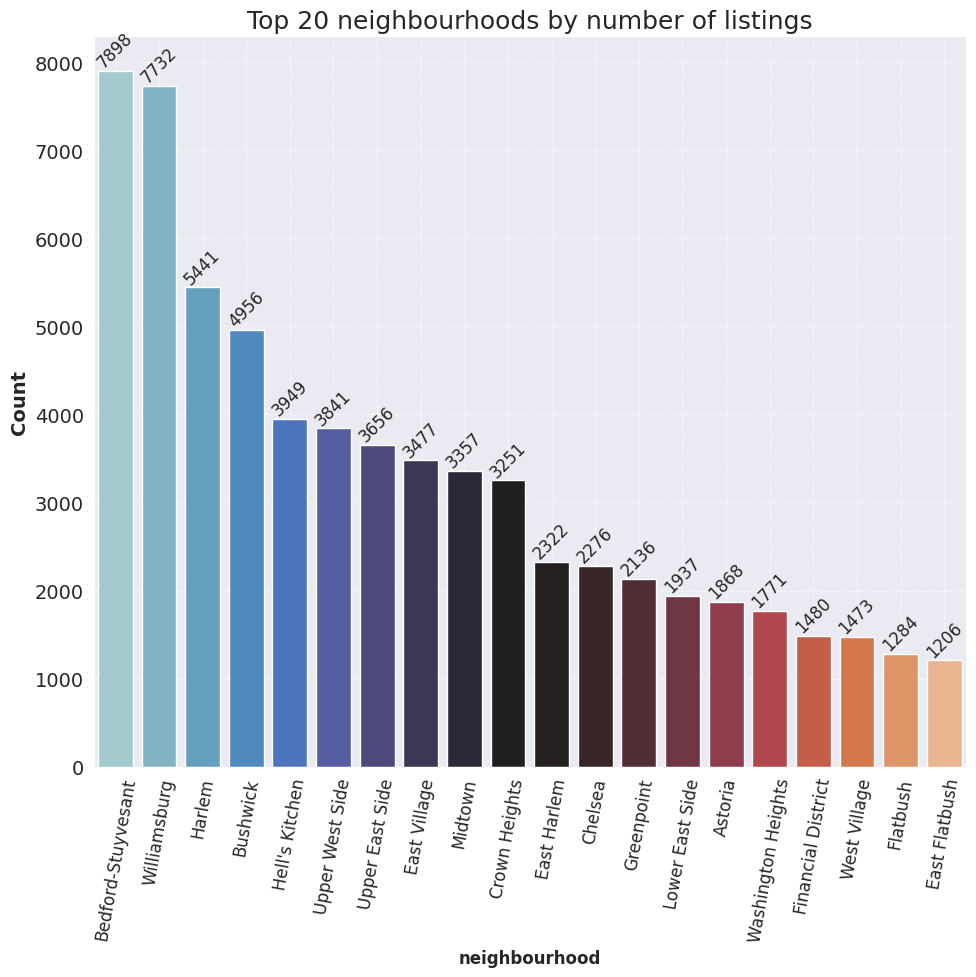

In [33]:
plot_bar_chart(df, column_name="neighbourhood", top_values=20, title_param='neighbourhoods by number of listings',
               palette="icefire", show_grid=True, figsize=(10, 10), 
               bar_font_size=12, bar_angle=45, x_label_angle=80, 
               title_font_size=18, x_label_font_size=12, y_label_font_size=14,
               show_percentage=False)

### What Proportion of Hosts Have Verified Identities versus Unverified?

In [34]:
value_counts = df['host_identity_verified'].value_counts()

# Convert value counts series to a DataFrame
table_df = pd.DataFrame({'Host Identity Verified': value_counts.index, 'Count': value_counts.values})

# Display the table using tabulate
table = tabulate(table_df, headers='keys', tablefmt='fancy_grid', showindex=False)
print(table)

╒══════════════════════════╤═════════╕
│ Host Identity Verified   │   Count │
╞══════════════════════════╪═════════╡
│ unconfirmed              │   50944 │
├──────────────────────────┼─────────┤
│ verified                 │   50825 │
╘══════════════════════════╧═════════╛


### Airbnb Cancellation Policies: What is the Distribution of Cancellation Policies Among Listings?

In [35]:
import colorcet as cc

glasbey_colors = cc.glasbey_light

fig = px.pie(df, names="cancellation_policy", values='tmp', hole=0.6,
             title="Cancellation Policy Distribution",
             color_discrete_sequence=glasbey_colors,
             hover_data=["cancellation_policy", "tmp"],
             labels={"cancellation_policy": "Cancellation Policy", "tmp": "Count"},
             template="plotly_white"  # Use a brighter template for a more appealing style
             )

# Add percentage and label information outside the pie chart
fig.update_traces(textposition='outside', textinfo='percent+label')

# Customize the layout
fig.update_layout(title=dict(font=dict(size=24)),  # Change the title font size
                  width=800, height=500,  # Set the figure dimensions
                  showlegend=True,  # Show the legend
                  legend_title_text="Cancellation Policy",  # Set the legend title
                  legend_font=dict(size=12),  # Adjust legend font size
                  )


fig.show()

### What is the Distribution of Room Types Among Listings?

In [36]:
import plotly.express as px

roomtype = df["room_type"].value_counts()

fig = px.pie(values=roomtype.values, names=roomtype.index,
             color_discrete_sequence=px.colors.sequential.RdBu,
             title="Room Type Distribution", template="presentation")

# Customize text and marker properties
fig.update_traces(textinfo="label+percent+value", textfont_size=13,
                  marker=dict(line=dict(color='gray', width=2)))

fig.show()

### What is the Distribution of Construction year Among Listings?

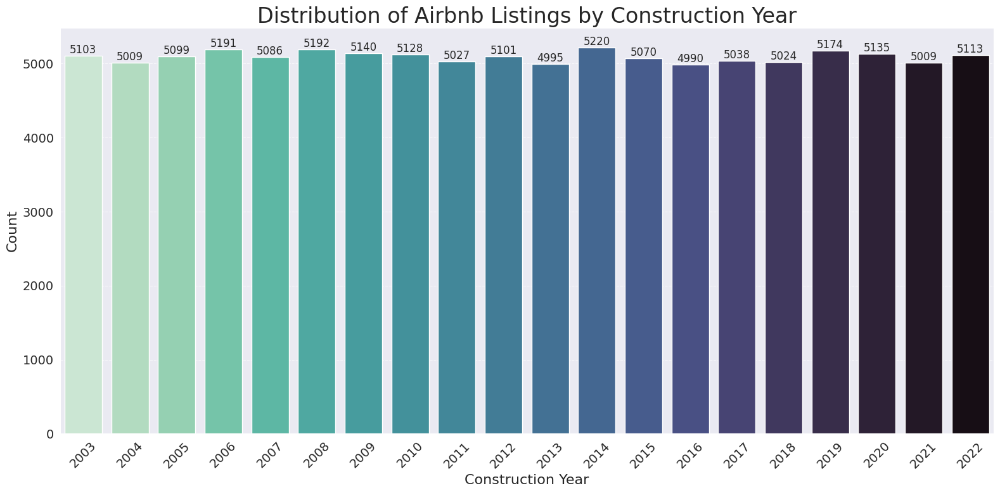

In [37]:
year = df["construction_year"].value_counts()

# Sort years in ascending order
year = year.sort_index()

colors = sns.color_palette("mako_r", len(year))

plt.figure(figsize=(16, 8))
sns.barplot(x=year.index.astype(int), y=year.values, palette=colors)

# Add data labels above each bar
for x, y in zip(range(len(year)), year.values):
    plt.text(x, y, str(y), ha="center", va="bottom", fontsize=12)

plt.xlabel("Construction Year", fontsize=16)
plt.ylabel("Count", fontsize=16)
plt.title("Distribution of Airbnb Listings by Construction Year", fontsize=24)

# Customize the appearance
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()


In [38]:
df.drop(columns=['tmp'],axis=1,inplace=True)

### Correlation between construction year and listing prices and among other numerical variables.

In [39]:
correlation = df['price'].corr(df['construction_year'])
print(f"Correlation between Price and Construction Year: {round(correlation, 6)}")

Correlation between Price and Construction Year: -0.003722


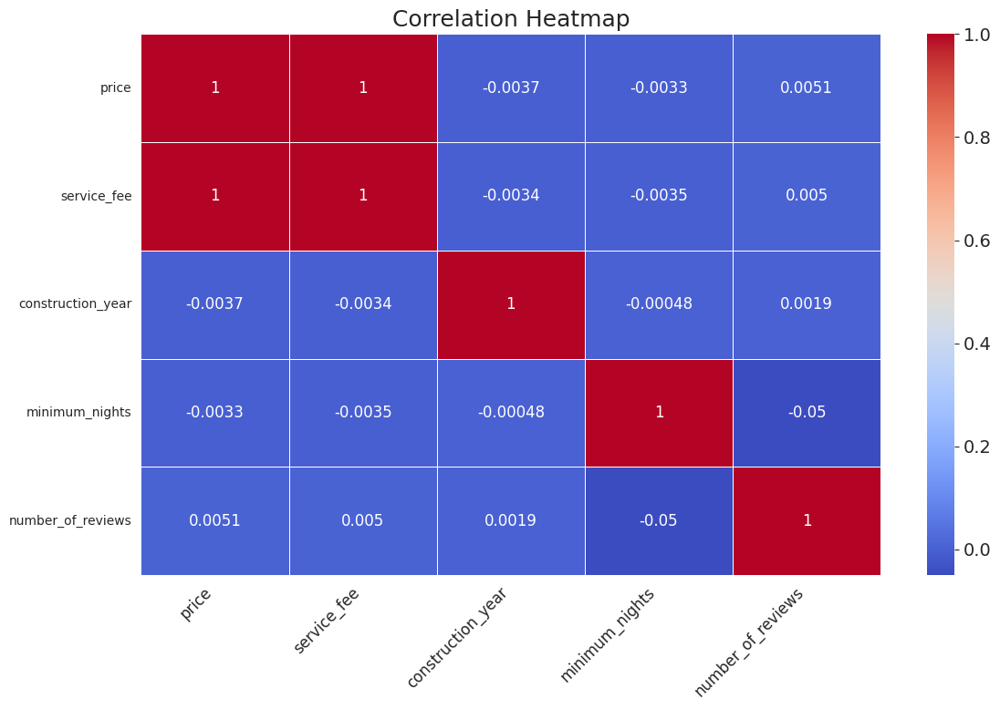

In [40]:
# Assuming 'df' is your DataFrame
correlation_matrix = df[['price','service_fee','construction_year', 'minimum_nights', 'number_of_reviews']].corr()

# Set up the figure size
plt.figure(figsize=(12, 8))

# Create the heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', annot_kws={'size': 12}, linewidths=0.5)

# Customize the appearance
plt.title('Correlation Heatmap', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()

# Display the heatmap
plt.show()

### Exploring Review Ratings Across Diverse Room Categories: How do Listings Vary in Reviews?

In [41]:
px.histogram(df, x="room_type", color="review_rate_number", barmode="group", title="Count of each review rate number")

### Price Patterns Across Room Types: How Do Listings Differ in Pricing?"

In [42]:
price_room_type_df=df.query("price!='Nan'")
price_room_type_df["price"]=df["price"]

In [43]:
fig = px.violin(price_room_type_df, x='room_type', y='price',
                title='Price Distribution by Room Type', box=True,
                points='all', hover_data=['price'],
                color_discrete_sequence=['#0362fc'])

# Customize the appearance
fig.update_layout(
    yaxis=dict(title='Price'),
    xaxis=dict(title='Room Type'),
    plot_bgcolor='#f7f7f7',  # Set background color
    font=dict(family='Arial', size=14),
)

# Update hover label for a more informative display
fig.update_traces(hovertemplate='Price: $%{y:.2f}')

# Show the plot
fig.show()

### Exploring the Relationship Between Host Identity Verification and Popularity on Review Rates.

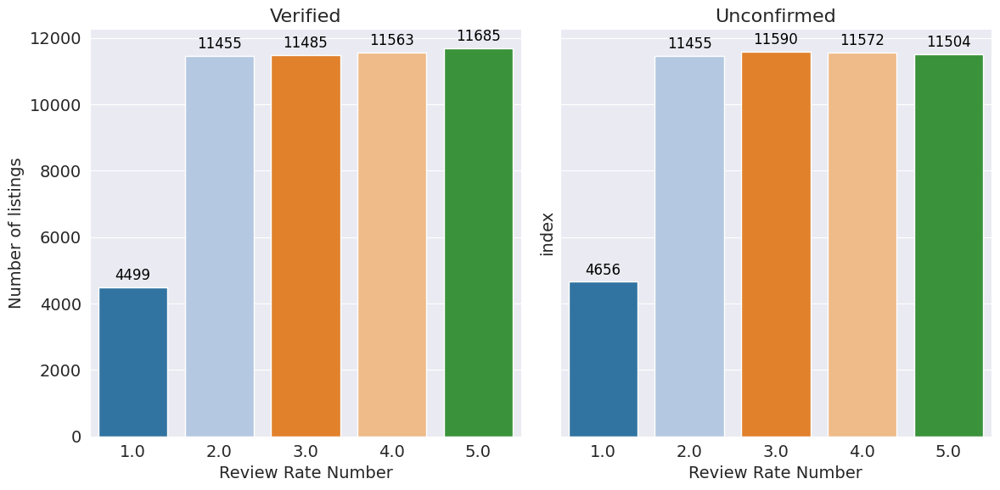

In [44]:
result_df = df[['host_identity_verified', 'review_rate_number', 'id']].reset_index().groupby(['host_identity_verified', 'review_rate_number']).count().reset_index()


# Create a figure and axes for the sub-plots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)


colors = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c']

# Filter the data for 'verified' and 'unconfirmed' categories
verified_data = result_df[result_df['host_identity_verified'] == 'verified']
unconfirmed_data = result_df[result_df['host_identity_verified'] == 'unconfirmed']

# Plot the bar graphs for 'verified' and 'unconfirmed' categories with custom colors
sns.barplot(x='review_rate_number', y='index', data=verified_data, ax=axes[0], palette=colors)
sns.barplot(x='review_rate_number', y='index', data=unconfirmed_data, ax=axes[1], palette=colors)

# Add count values at the top of each bar
for ax in axes:
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=12, color='black', xytext=(0, 10),
                    textcoords='offset points')

# Customize the sub-plots
axes[0].set_title('Verified', fontsize=16)
axes[1].set_title('Unconfirmed', fontsize=16)
axes[0].set_xlabel('Review Rate Number', fontsize=14)
axes[1].set_xlabel('Review Rate Number', fontsize=14)
axes[0].set_ylabel('Number of listings', fontsize=14)

# Adjust the layout and spacing between sub-plots
plt.tight_layout()

# Show the plot
plt.show()

### Airbnb Listings by Season and Neighborhood Groups.

In [45]:
# Extract month number from the datetime column
df['month_number'] = df['last_review'].dt.month

# Map month number to month name
month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June',
               7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'}

df['month_name'] = df['month_number'].map(month_names)


# Define a function to map month names to seasons
def get_season(month_name):
    if month_name in ['December', 'January', 'February']:
        return 'Winter'
    elif month_name in ['March', 'April', 'May']:
        return 'Spring'
    elif month_name in ['June', 'July', 'August']:
        return 'Summer'
    elif month_name in ['September', 'October', 'November']:
        return 'Autumn'
    else:
        return 'Unknown'

# Apply the function to create the 'season' column
df['season'] = df['month_name'].apply(get_season)

season_df = df[['neighbourhood_group', 'season', 'id']].groupby(['season', 'neighbourhood_group']).count().reset_index()

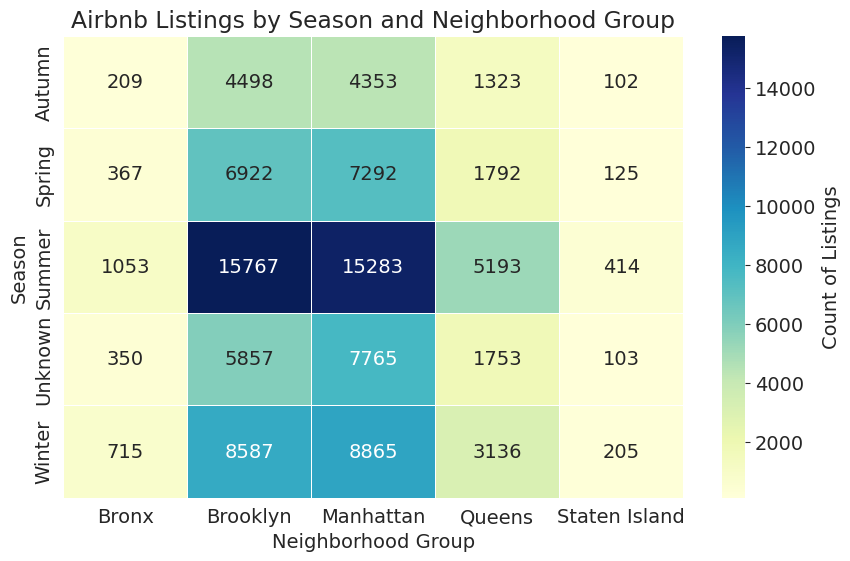

In [46]:
pivot_df = season_df.pivot(index='season', columns='neighbourhood_group', values='id')

# Plot a heatmap to visualize the count of listings in each season and neighborhood group
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, annot=True, fmt='g', cmap='YlGnBu', linewidths=0.5, cbar_kws={'label': 'Count of Listings'})
plt.title('Airbnb Listings by Season and Neighborhood Group')
plt.xlabel('Neighborhood Group')
plt.ylabel('Season')
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=8401835c-4824-49e5-8d50-1b70a4cc213d' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>